### Dökümanlar
* Zaman Serisi Video(codebasics): https://www.youtube.com/playlist?list=PLeo1K3hjS3uvMADnFjV1yg6E5nVU4kOob

In [5]:
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
%matplotlib inline

Veri setini okuduktan sonra Tarih özelliğimiz string veri tipinde gelmektedir. Bu özelliği datetime nesnesine dönüştürme işlemi yapmamız gerekiyor. Veri setini pandas ile bir dataframe nesnesine aktardığımızda otomatik olarak index (0-1-2-..) atanmaktadır. Bu index bizim için bir önem sarf etmediğinden indexi Tarih olarak sonradan değiştirmemiz gerekiyor. Aşağıdaki kodlar ile bu işlemi yapabiliyoruz.
```python
data.Tarih = pd.to_datetime(data.Tarih, format='%d-%m-%Y')
data = data.set_index("Tarih")
```
Ancak ekstra kod yazmadan bu işlemi basit bir yoldan aynı işlevi görecek şekilde yapabiliriz.
```python
df = pd.read_excel('VeriSeti.xlsx', parse_dates=['Öznitelikİsmi'], index_col='Öznitelikİsmi')
```

In [6]:
data = pd.read_excel('EVDS_Data.xlsx', parse_dates=['Tarih'], dayfirst=True, index_col='Tarih')

In [7]:
data.head()

,USD_Alis,EURO_Alis,GBP_Alis
Tarih,,,
2004-02-09,1.332801,1.672132,2.445506
2004-02-10,1.342133,1.709341,2.494961
2004-02-11,1.338843,1.709301,2.501692
2004-02-12,1.334726,1.691499,2.494668
2004-02-13,1.314923,1.685600,2.487623


In [8]:
data.shape

(5906, 3)

In [9]:
data = data.astype('float32')

In [10]:
data.corr()

,USD_Alis,EURO_Alis,GBP_Alis
USD_Alis,1.000000,0.993334,0.990898
EURO_Alis,0.993334,1.000000,0.987743
GBP_Alis,0.990898,0.987743,1.000000


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5906 entries, 2004-02-09 to 2020-04-10
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   USD_Alis   4075 non-null   float32
 1   EURO_Alis  4075 non-null   float32
 2   GBP_Alis   4075 non-null   float32
dtypes: float32(3)
memory usage: 115.4 KB


In [12]:
data.describe()

,USD_Alis,EURO_Alis,GBP_Alis
count,4075.000000,4075.000000,4075.000000
mean,2.399610,2.922894,3.580958
std,1.396606,1.467286,1.564385
min,1.144900,1.549500,2.110500
25%,1.452747,1.893400,2.467200
50%,1.780900,2.325000,2.821900
75%,2.935200,3.286000,4.232250
max,6.879800,7.832700,8.758000


In [13]:
traces = []
name = {'USD_Alis': 'USD Alış', 'EURO_Alis': 'EURO Alış', 'GBP_Alis': 'GBP Alış'}
for column in data.columns:
    traces.append(go.Box(
        y=data[column],
        opacity=1,
        name = name[column],
        marker=dict(size=3)
        #boxpoints='all'
        )
    )
    
layout = go.Layout(
    title='USD, EURO, GBP Merkezi Eğilim Ve Yayılım Ölçüleri Kutu Grafiği'
)

go.Figure(data=traces, layout=layout)

In [14]:
traces = []

for column in data.columns:
    traces.append(go.Scatter(
        x=data.index,
        y=data[column],
        opacity=1,
        name = name[column],
        marker=dict(size=3)
        )
    )
    
layout = go.Layout(
    xaxis=dict(tickangle=-60, tickvals=data.index[::365], tickformat= '%d/%m/%Y'),
    title='USD, EURO, GBP 02.2004-02.2020 Günlük Zaman Serisi'
)

go.Figure(data=traces, layout=layout)

In [15]:
traces = []

for column in data.columns:
    traces.append(go.Scatter(
        x=pd.date_range(data.index.min(), data.index.max(), freq='W'),
        y=data[column].resample('W').mean(),
        opacity=1,
        name = name[column],
        marker=dict(size=3)
        )
    )
    
layout = go.Layout(
    xaxis=dict(tickangle=-60, tickvals=pd.date_range(data.index.min(), data.index.max(), freq='Y'), tickformat= '%d/%m/%Y'),
    title='USD, EURO, GBP 02.2004-02.2020 Haftalık (Ortalaması Alınmış) Zaman Serisi'
)

go.Figure(data=traces, layout=layout)

In [16]:
traces = []

for column in data.columns:
    traces.append(go.Scatter(
        x=pd.date_range(data.index.min(), data.index.max(), freq='M'),
        y=data[column].resample('M').mean(),
        opacity=1,
        name = name[column],
        marker=dict(size=3)
        )
    )
    
layout = go.Layout(
    xaxis=dict(tickangle=-60, tickvals=pd.date_range(data.index.min(), data.index.max(), freq='Y'), tickformat= '%d/%m/%Y'),
    title='USD, EURO, GBP 02.2004-02.2020 Aylık (Ortalaması Alınmış) Zaman Serisi'
)

go.Figure(data=traces, layout=layout)

In [17]:
traces = []

for column in data.columns:
    traces.append(go.Scatter(
        x=pd.date_range(data.index.min(), data.index.max(), freq='Q'),
        y=data[column].resample('Q').mean(),
        opacity=1,
        name = name[column],
        marker=dict(size=3)
        )
    )
    
layout = go.Layout(
    xaxis=dict(tickangle=-60, tickvals=pd.date_range(data.index.min(), data.index.max(), freq='Y'), tickformat= '%d/%m/%Y'),
    title='USD, EURO, GBP 02.2004-02.2020 Çeyrek Aralık (Ortalaması Alınmış) Zaman Serisi'
)

go.Figure(data=traces, layout=layout)

In [18]:
traces = []

for column in data.columns:
    traces.append(go.Scatter(
        x=pd.date_range(data.index.min(), data.index.max(), freq='AS'),
        y=data[column].resample('AS').mean(),
        opacity=1,
        name = name[column],
        marker=dict(size=3)
        )
    )
    
layout = go.Layout(
    xaxis=dict(tickangle=-60),
    title='USD, EURO, GBP Yıllık (Ortalaması Alınmış) Zaman Serisi'
)

go.Figure(data=traces, layout=layout)

In [19]:
data.isnull().sum().sum()

5493

In [20]:
data.isnull().sum()

USD_Alis     1831
EURO_Alis    1831
GBP_Alis     1831
dtype: int64

In [21]:
data.interpolate(method='linear', limit_direction='both', inplace=True)

In [22]:
data.isnull().sum()

USD_Alis     0
EURO_Alis    0
GBP_Alis     0
dtype: int64

In [23]:
data.describe()

,USD_Alis,EURO_Alis,GBP_Alis
count,5906.000000,5906.000000,5906.000000
mean,2.400880,2.924954,3.581831
std,1.397493,1.468468,1.565070
min,1.144900,1.549500,2.110500
25%,1.453500,1.895812,2.466725
50%,1.781050,2.325650,2.822250
75%,2.933700,3.287825,4.230750
max,6.879800,7.832700,8.758000


* Veriyi temizledikten sonra günlük zaman serisini tekrar inceleyebiliriz.

In [24]:
traces = []

for column in data.columns:
    traces.append(go.Scatter(
        x=data.index,
        y=data[column],
        opacity=1,
        name = name[column]
        )
    )
    
layout = go.Layout(
    xaxis=dict(tickangle=-60, tickvals=data.index[::365], tickformat= '%d/%m/%Y'),
    title='USD, EURO, GBP 02.2004-02.2020 Günlük Zaman Serisi'
)

go.Figure(data=traces, layout=layout)

* rolling: Her adım için k kadar ilerler ve verilen matematiksel işlemi gerçekleştirir.
* Burada, her adım için 90 gün ileri gidip ortalamayı alır.

In [25]:
x = data['USD_Alis'].rolling(90).mean()

traces = go.Scatter(
    x=x.index,
    y=x.values,
    opacity=1,
    name = 'USD Alış'
    )
    
layout = go.Layout(
    xaxis=dict(tickangle=-60, tickvals=data.index[::365], tickformat= '%d/%m/%Y'),
    title='USD 02.2004-02.2020 90 Günlük (Ortalaması) Zaman Serisi'
)

go.Figure(data=traces, layout=layout)

In [26]:
df = data.copy()

In [27]:
df['USD_Degisim'] = data['USD_Alis'].diff()
df['EURO_Degisim'] = data['EURO_Alis'].diff()
df['GBP_Degisim'] = data['GBP_Alis'].diff()
df.head()

,USD_Alis,EURO_Alis,GBP_Alis,USD_Degisim,EURO_Degisim,GBP_Degisim
Tarih,,,,,,
2004-02-09,1.332801,1.672132,2.445506,NaN,NaN,NaN
2004-02-10,1.342133,1.709341,2.494961,0.009332,0.037209,0.049455
2004-02-11,1.338843,1.709301,2.501692,-0.003290,-0.000040,0.006731
2004-02-12,1.334726,1.691499,2.494668,-0.004117,-0.017802,-0.007024
2004-02-13,1.314923,1.685600,2.487623,-0.019803,-0.005899,-0.007045


In [28]:
trace = go.Scatter(
    x=df.index,
    y=df['USD_Degisim'],
    opacity=1,
    name = 'USD Değişim',
    showlegend=True
    )
    
layout = go.Layout(
    title='USD Günlük Değişim Oranı'
)

go.Figure(data=trace, layout=layout)

In [29]:
trace = go.Scatter(
    x=df.index,
    y=df['EURO_Degisim'],
    opacity=1,
    name = 'EURO Değişim',
    showlegend=True
    )
    
layout = go.Layout(
    title='EURO Günlük Değişim Oranı'
)

go.Figure(data=trace, layout=layout)

In [30]:
trace = go.Scatter(
    x=df.index,
    y=df['GBP_Degisim'],
    opacity=1,
    name = 'GBP Değişim',
    showlegend=True
    )
    
layout = go.Layout(
    title='GBP Günlük Değişim Oranı'
)

go.Figure(data=trace, layout=layout)

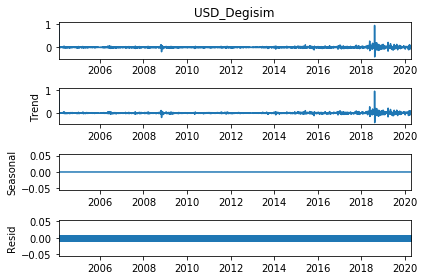

In [31]:
df.fillna(1, inplace=True)
from statsmodels.tsa.seasonal import seasonal_decompose
seasonal = seasonal_decompose(df['USD_Degisim'], model='additive', period=1)
seasonal.plot()
plt.show()

In [32]:
from statsmodels.tsa.stattools import adfuller

X = data['USD_Alis'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: 1.608741
p-value: 0.997884
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


### LSTM MODEL

In [33]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Activation
from sklearn.utils import shuffle
from math import sqrt

Using TensorFlow backend.


In [34]:
values = data['USD_Alis'].values.reshape(-1,1)
values

array([[1.332801],
       [1.342133],
       [1.338843],
       ...,
       [6.7375  ],
       [6.7705  ],
       [6.7382  ]], dtype=float32)

In [35]:
scaler = MinMaxScaler()
values = scaler.fit_transform(values)

In [36]:
train_size = int(np.floor(len(values) * 0.80))
test_size = len(values) - train_size

In [37]:
train, test = values[:train_size:], values[train_size::]
print('train_size: {}, test_size: {}'.format(train.shape, test.shape))

train_size: (4724, 1), test_size: (1182, 1)


In [38]:
def create_dataset(dataset, window_size = 1):
    data_X, data_Y = [], []
    for i in range(len(dataset) - window_size):
        a = dataset[i:(i + window_size), 0]
        data_X.append(a)
        data_Y.append(dataset[i + window_size, 0])
    return np.array(data_X), np.array(data_Y)

In [39]:
window_size = 7
train_X, train_Y = create_dataset(train, window_size)
test_X, test_Y = create_dataset(test, window_size)
print(train_X.shape)

(4717, 7)


In [40]:
train_X[0:3]

array([[0.03276448, 0.03439172, 0.03381802, 0.03310014, 0.02964708,
        0.02942982, 0.02921253],
       [0.03439172, 0.03381802, 0.03310014, 0.02964708, 0.02942982,
        0.02921253, 0.02899528],
       [0.03381802, 0.03310014, 0.02964708, 0.02942982, 0.02921253,
        0.02899528, 0.02996774]], dtype=float32)

In [41]:
train_Y

array([0.02899528, 0.02996774, 0.02947131, ..., 0.47170836, 0.4704703 ,
       0.4679361 ], dtype=float32)

In [42]:
train_X = np.reshape(train_X, (train_X.shape[0], train_X.shape[1], 1))
test_X = np.reshape(test_X, (test_X.shape[0], test_X.shape[1], 1))
print(train_X.shape)

(4717, 7, 1)


In [43]:
train_X[0:1]

array([[[0.03276448],
        [0.03439172],
        [0.03381802],
        [0.03310014],
        [0.02964708],
        [0.02942982],
        [0.02921253]]], dtype=float32)

LSTM ve Dense katmanlarının varsayılan aktivasyon fonksiyon **tanh**'dır. Veri setini (0,1) arasında scaling yaptığım için burada **sigmoid** fonksiyonunun kullanılması uygundur.

In [44]:
def model_lstm(batch_size, activation, epochs, train_X, train_Y):
    
    model = Sequential()
    model.add(LSTM(64, return_sequences=False, activation=activation, input_shape = (train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation=activation))
    model.compile(loss='mean_squared_error', optimizer = 'adam', metrics=['accuracy'])
    history = model.fit(train_X,
                        train_Y, 
                        epochs=epochs,
                        batch_size=batch_size
                     )

    model.summary()
    
    return history

In [45]:
def model_lstm2(batch_size, activation, epochs, train_X, train_Y):
    model = Sequential()
    model.add(LSTM(100, return_sequences=True, activation=activation, input_shape = (train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(0.2))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation=activation))
    model.compile(loss='mean_squared_error', optimizer = 'adam', metrics=['accuracy'])
    history = model.fit(train_X,
                        train_Y, 
                        epochs=epochs,
                        batch_size=batch_size
                     )

    model.summary()
    return history

In [46]:
def loss(model, name, scale):
    plt.plot(model.history['loss'], label=name)
    plt.title('loss')
    plt.xlabel='epoch'
    plt.ylabel='loss'
    plt.legend(loc='upper right')
    plt.yscale(scale)

In [47]:
def predict_and_score(model, X, Y):
    plt.figure(figsize=(10,8))
    predict = model.predict(X)
    pred_X = scaler.inverse_transform(predict)
    data_Y = scaler.inverse_transform([Y])
    
    score = sqrt(mean_squared_error(data_Y[0], pred_X[:, 0]))
    return score, pred_X

In [48]:
def dataset_plot(dataset, train_pred, test_pred, windows_size):
    plt.figure(figsize=(8,6))
    train_predict_plot = np.empty_like(dataset)
    train_predict_plot[:, :] = np.nan
    train_predict_plot[window_size:len(train_pred) + window_size, :] = train_pred

    test_predict_plot = np.empty_like(dataset)
    test_predict_plot[:, :] = np.nan
    test_predict_plot[len(train_pred) + (window_size * 2):len(dataset), :] = test_pred

    plt.plot(scaler.inverse_transform(values))
    plt.plot(train_predict_plot)
    plt.plot(test_predict_plot)
    plt.show()

#### Stochastic Gradien Descent
Eğitim setindeki her örnek için geri yayılım ile eğitim parametlerini günceller.
* batch_size ile bu adım sayısı belirlenir ve batch_size = 1 olmalıdır.

In [87]:
sgd_model = model_lstm(1, 'sigmoid', 10, train_X, train_Y)

Epoch 1/10
4717/4717 [==============================] - 40s 8ms/step - loss: 0.0034 - accuracy: 2.1200e-04
Epoch 2/10
4717/4717 [==============================] - 36s 8ms/step - loss: 1.6942e-04 - accuracy: 2.1200e-04
Epoch 3/10
4717/4717 [==============================] - 36s 8ms/step - loss: 8.0321e-05 - accuracy: 2.1200e-04
Epoch 4/10
4717/4717 [==============================] - 37s 8ms/step - loss: 5.7141e-05 - accuracy: 2.1200e-04
Epoch 5/10
4717/4717 [==============================] - 37s 8ms/step - loss: 4.3671e-05 - accuracy: 2.1200e-04
Epoch 6/10
4717/4717 [==============================] - 36s 8ms/step - loss: 3.5623e-05 - accuracy: 2.1200e-04
Epoch 7/10
4717/4717 [==============================] - 37s 8ms/step - loss: 3.1139e-05 - accuracy: 2.1200e-04
Epoch 8/10
4717/4717 [==============================] - 36s 8ms/step - loss: 2.9849e-05 - accuracy: 2.1200e-04
Epoch 9/10
4717/4717 [==============================] - 36s 8ms/step - loss: 2.3948e-05 - accuracy: 2.1200e-04
Epoch

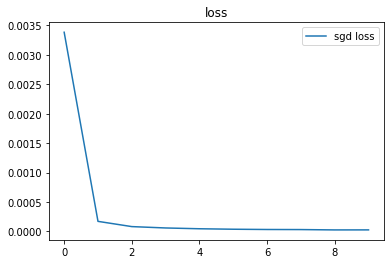

In [88]:
loss(sgd_model, 'sgd loss', 'linear')

* Tahminler scale edilmiş halinden geri çevirip, rmse değerlerini ölçüyorum.

In [51]:
rmse_sgd_train, sgd_train_predict = predict_and_score(sgd_model.model, train_X, train_Y)
rmse_sgd_test, sgd_test_predict = predict_and_score(sgd_model.model, test_X, test_Y)
print("Eğitim seti skoru: %.3f RMSE" % rmse_sgd_train)
print("Test seti skoru: %.3f RMSE" % rmse_sgd_test)

Eğitim seti skoru: 0.051 RMSE
Test seti skoru: 0.803 RMSE


<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

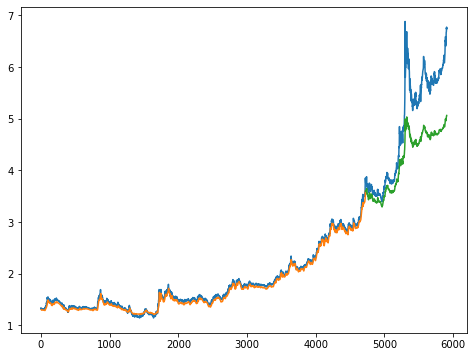

In [89]:
dataset_plot(values, sgd_train_predict, sgd_test_predict, window_size)

#### Mini Batch Gradien Descent
Eğitim setini 1 ile veri seti büyüklüğü arasındaki bir değer için geri yayılım ile eğitim parametlerini günceller. Model daha küçük eğitim örnekleri grubuna göre güncellenir yani belli parçalara bölünür.

In [53]:
mbgd_model2 = model_lstm2(32, 'sigmoid', 10, train_X, train_Y)

Epoch 1/10
4717/4717 [==============================] - 3s 570us/step - loss: 0.0139 - accuracy: 2.1200e-04
Epoch 2/10
4717/4717 [==============================] - 2s 493us/step - loss: 0.0097 - accuracy: 2.1200e-04
Epoch 3/10
4717/4717 [==============================] - 3s 646us/step - loss: 0.0094 - accuracy: 2.1200e-04
Epoch 4/10
4717/4717 [==============================] - 3s 631us/step - loss: 0.0079 - accuracy: 2.1200e-04
Epoch 5/10
4717/4717 [==============================] - 2s 479us/step - loss: 0.0026 - accuracy: 2.1200e-04
Epoch 6/10
4717/4717 [==============================] - 2s 474us/step - loss: 0.0013 - accuracy: 2.1200e-04
Epoch 7/10
4717/4717 [==============================] - 2s 488us/step - loss: 9.7312e-04 - accuracy: 2.1200e-04
Epoch 8/10
4717/4717 [==============================] - 2s 471us/step - loss: 7.3963e-04 - accuracy: 2.1200e-04
Epoch 9/10
4717/4717 [==============================] - 2s 480us/step - loss: 6.6116e-04 - accuracy: 2.1200e-04
Epoch 10/10
4717

In [54]:
mbgd_model = model_lstm(32, 'sigmoid', 10, train_X, train_Y)

Epoch 1/10
4717/4717 [==============================] - 1s 305us/step - loss: 0.0158 - accuracy: 2.1200e-04
Epoch 2/10
4717/4717 [==============================] - 1s 246us/step - loss: 0.0087 - accuracy: 2.1200e-04
Epoch 3/10
4717/4717 [==============================] - 1s 246us/step - loss: 0.0081 - accuracy: 2.1200e-04
Epoch 4/10
4717/4717 [==============================] - 1s 270us/step - loss: 0.0072 - accuracy: 2.1200e-04
Epoch 5/10
4717/4717 [==============================] - 1s 253us/step - loss: 0.0059 - accuracy: 2.1200e-04
Epoch 6/10
4717/4717 [==============================] - 1s 244us/step - loss: 0.0035 - accuracy: 2.1200e-04
Epoch 7/10
4717/4717 [==============================] - 1s 245us/step - loss: 6.1690e-04 - accuracy: 2.1200e-04
Epoch 8/10
4717/4717 [==============================] - 1s 247us/step - loss: 3.7648e-04 - accuracy: 2.1200e-04
Epoch 9/10
4717/4717 [==============================] - 1s 251us/step - loss: 3.2349e-04 - accuracy: 2.1200e-04
Epoch 10/10
4717

In [55]:
rmse_mbgd2_train, mbgd_train2_predict = predict_and_score(mbgd_model2.model, train_X, train_Y)
rmse_mbgd2_test, mbgd_test2_predict = predict_and_score(mbgd_model2.model, test_X, test_Y)
print("Eğitim seti skoru: %.3f RMSE" % rmse_mbgd2_train)
print("Test seti skoru: %.3f RMSE" % rmse_mbgd2_test)

Eğitim seti skoru: 0.069 RMSE
Test seti skoru: 1.449 RMSE


<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

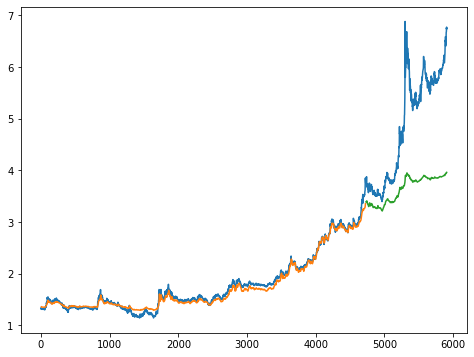

In [56]:
dataset_plot(values, mbgd_train2_predict, mbgd_test2_predict, window_size)

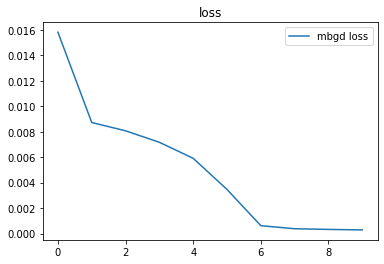

In [57]:
loss(mbgd_model, 'mbgd loss', 'linear')

In [58]:
rmse_mbgd_train, mbgd_train_predict = predict_and_score(mbgd_model.model, train_X, train_Y)
rmse_mbgd_test, mbgd_test_predict = predict_and_score(mbgd_model.model, test_X, test_Y)
print("Eğitim seti skoru: %.3f RMSE" % rmse_mbgd_train)
print("Test seti skoru: %.3f RMSE" % rmse_mbgd_test)

Eğitim seti skoru: 0.093 RMSE
Test seti skoru: 0.289 RMSE


<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

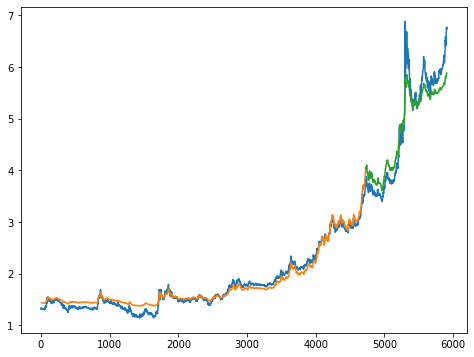

In [59]:
dataset_plot(values, mbgd_train_predict, mbgd_test_predict, window_size)

#### Batch Gradien Descent
Ağırlıklar her periyot (epoch) sonrasında güncellenir. Eğitim setindeki tüm örnekler için hata hesaplanır ve toplam hataya göre geri yayılım ile eğitim parametrelerini günceller.

In [60]:
bgd_model = model_lstm(len(train_X), 'sigmoid', 10, train_X, train_Y)

Epoch 1/10
4717/4717 [==============================] - 0s 72us/step - loss: 0.1713 - accuracy: 0.0000e+00
Epoch 2/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.1520 - accuracy: 2.1200e-04
Epoch 3/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.1340 - accuracy: 2.1200e-04
Epoch 4/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.1174 - accuracy: 2.1200e-04
Epoch 5/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.1023 - accuracy: 2.1200e-04
Epoch 6/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.0886 - accuracy: 2.1200e-04
Epoch 7/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.0763 - accuracy: 2.1200e-04
Epoch 8/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.0655 - accuracy: 2.1200e-04
Epoch 9/10
4717/4717 [==============================] - 0s 5us/step - loss: 0.0560 - accuracy: 2.1200e-04
Epoch 10/10
4717/4717 [======================

In [61]:
rmse_bgd_train, bgd_train_predict = predict_and_score(bgd_model.model, train_X, train_Y)
rmse_bgd_test, bgd_test_predict = predict_and_score(bgd_model.model, test_X, test_Y)
print("Eğitim seti skoru: %.3f RMSE" % rmse_bgd_train)
print("Test seti skoru: %.3f RMSE" % rmse_bgd_test)

Eğitim seti skoru: 1.158 RMSE
Test seti skoru: 2.315 RMSE


<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

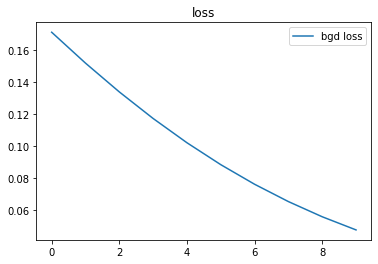

In [62]:
loss(bgd_model, 'bgd loss', 'linear')

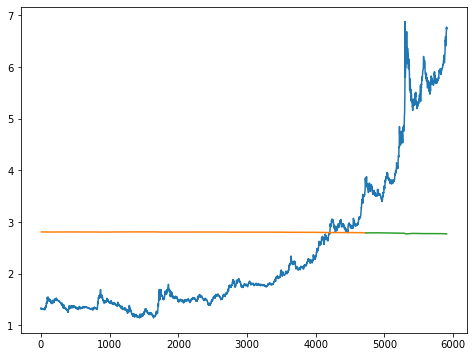

In [63]:
dataset_plot(values, bgd_train_predict, bgd_test_predict, window_size)

#### Karşılaştırma
Farklı gradient descentler ile eğittimiz modellerin loss görselini ve rmse değerlerini karşılaştıralım

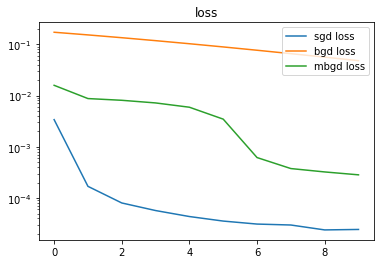

In [90]:
loss(sgd_model, 'sgd loss', 'log')
loss(bgd_model, 'bgd loss', 'log')
loss(mbgd_model, 'mbgd loss', 'log')
plt.show()

In [65]:
print('SGD RMSE EĞİTİM: {0}, TEST: {1}\nMBGD RMSE EĞİTİM: {2}, TEST: {3}\nBGD RMSE EĞİTİM: {4}, TEST: {5}'.format(
        rmse_sgd_train, rmse_sgd_test, rmse_mbgd_train, rmse_mbgd_test, rmse_bgd_train, rmse_bgd_test))

SGD RMSE EĞİTİM: 0.051291564064405694, TEST: 0.8025830619962772
MBGD RMSE EĞİTİM: 0.09262770635563482, TEST: 0.28889920931413215
BGD RMSE EĞİTİM: 1.1578518143774372, TEST: 2.314898263298414


In [66]:
look_back = 30
train_x, train_y = create_dataset(train, look_back)
test_x, test_y = create_dataset(test, look_back)
print(train_x.shape)

(4694, 30)


In [67]:
train_x = np.reshape(train_x, (train_x.shape[0], train_x.shape[1], 1))
test_x = np.reshape(test_x, (test_x.shape[0], test_x.shape[1], 1))
print(train_x.shape)

(4694, 30, 1)


In [68]:
model1 = model_lstm(32, 'sigmoid', 10, train_x, train_y)

Epoch 1/10
4694/4694 [==============================] - 3s 737us/step - loss: 0.0221 - accuracy: 2.1304e-04
Epoch 2/10
4694/4694 [==============================] - 3s 692us/step - loss: 0.0088 - accuracy: 2.1304e-04
Epoch 3/10
4694/4694 [==============================] - 3s 673us/step - loss: 0.0083 - accuracy: 2.1304e-04
Epoch 4/10
4694/4694 [==============================] - 3s 672us/step - loss: 0.0074 - accuracy: 2.1304e-04
Epoch 5/10
4694/4694 [==============================] - 3s 673us/step - loss: 0.0060 - accuracy: 2.1304e-04
Epoch 6/10
4694/4694 [==============================] - 3s 664us/step - loss: 0.0024 - accuracy: 2.1304e-04
Epoch 7/10
4694/4694 [==============================] - 3s 676us/step - loss: 2.2595e-04 - accuracy: 2.1304e-04
Epoch 8/10
4694/4694 [==============================] - 3s 665us/step - loss: 1.2641e-04 - accuracy: 2.1304e-04
Epoch 9/10
4694/4694 [==============================] - 3s 675us/step - loss: 9.7723e-05 - accuracy: 2.1304e-04
Epoch 10/10
4694

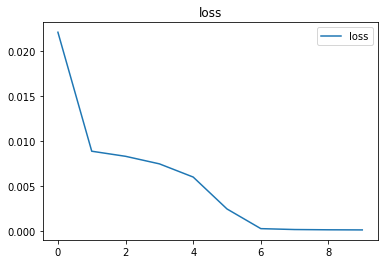

In [69]:
loss(model1, 'loss', 'linear')

In [70]:
rmse_model1_train, model1_train_predict = predict_and_score(model1.model, train_x, train_y)
rmse_model1_test, model1_test_predict = predict_and_score(model1.model, test_x, test_y)
print("Eğitim seti skoru: %.3f RMSE" % rmse_model1_train)
print("Test seti skoru: %.3f RMSE" % rmse_model1_test)

Eğitim seti skoru: 0.049 RMSE
Test seti skoru: 0.767 RMSE


<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

In [71]:
model1_train_predict.shape

(4694, 1)

In [72]:
model1_test_predict.shape

(1152, 1)

In [73]:
def dataset_plot(dataset, train_pred, test_pred, windows_size):
    plt.figure(figsize=(8,6))
    train_predict_plot = np.empty_like(dataset)
    train_predict_plot[:, :] = np.nan
    train_predict_plot[window_size:len(train_pred) + window_size, :] = train_pred

    test_predict_plot = np.empty_like(dataset)
    test_predict_plot[:, :] = np.nan
    test_predict_plot[len(train_pred) + (window_size * 2):len(dataset), :] = test_pred

    plt.plot(scaler.inverse_transform(values))
    plt.plot(train_predict_plot)
    plt.plot(test_predict_plot)
    plt.show()

In [74]:
dataset_plot(values, model1_train_predict, model1_test_predict, look_back)

ValueError: could not broadcast input array from shape (1152,1) into shape (1198,1)

<Figure size 576x432 with 0 Axes>

In [75]:
df = data['USD_Alis'].values.reshape(-1,1)

In [76]:
scalerdf = MinMaxScaler(feature_range=(-1,1))
df = scalerdf.fit_transform(df)

In [77]:
traindf_size = int(np.floor(len(df) * 0.80))
testdf_size = len(df) - train_size

In [78]:
traindf, testdf = values[:traindf_size:], values[traindf_size::]
print('train_size: {}, test_size: {}'.format(traindf.shape, testdf.shape))

train_size: (4724, 1), test_size: (1182, 1)


In [79]:
traindf_X, traindf_Y = create_dataset(traindf, window_size)
testdf_X, testdf_Y = create_dataset(testdf, window_size)
print(traindf_X.shape)

(4717, 7)


In [80]:
traindf_X = np.reshape(traindf_X, (traindf_X.shape[0], traindf_X.shape[1], 1))
testdf_X = np.reshape(testdf_X, (testdf_X.shape[0], testdf_X.shape[1], 1))
print(traindf_X.shape)

(4717, 7, 1)


In [81]:
model2 = model_lstm(32, 'tanh', 10, traindf_X, traindf_Y)

Epoch 1/10
4717/4717 [==============================] - 1s 317us/step - loss: 9.0816e-04 - accuracy: 2.1200e-04
Epoch 2/10
4717/4717 [==============================] - 1s 251us/step - loss: 1.6887e-05 - accuracy: 2.1200e-04
Epoch 3/10
4717/4717 [==============================] - 1s 262us/step - loss: 1.7150e-05 - accuracy: 2.1200e-04
Epoch 4/10
4717/4717 [==============================] - 1s 256us/step - loss: 1.7302e-05 - accuracy: 2.1200e-04
Epoch 5/10
4717/4717 [==============================] - 1s 255us/step - loss: 1.7068e-05 - accuracy: 2.1200e-04
Epoch 6/10
4717/4717 [==============================] - 1s 251us/step - loss: 1.6910e-05 - accuracy: 2.1200e-04
Epoch 7/10
4717/4717 [==============================] - 1s 248us/step - loss: 1.7449e-05 - accuracy: 2.1200e-04
Epoch 8/10
4717/4717 [==============================] - 1s 253us/step - loss: 1.7134e-05 - accuracy: 2.1200e-04
Epoch 9/10
4717/4717 [==============================] - 1s 253us/step - loss: 1.6592e-05 - accuracy: 2.1

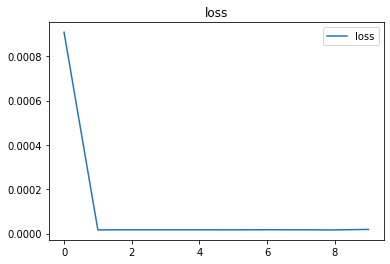

In [82]:
loss(model2, 'loss', 'linear')

In [83]:
rmse_model2_train, model2_train_predict = predict_and_score(model2.model, traindf_X, traindf_Y)
rmse_model2_test, model2_test_predict = predict_and_score(model2.model, testdf_X, testdf_Y)
print("Eğitim seti skoru: %.3f RMSE" % rmse_model2_train)
print("Test seti skoru: %.3f RMSE" % rmse_model2_test)

Eğitim seti skoru: 0.024 RMSE
Test seti skoru: 0.371 RMSE


<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

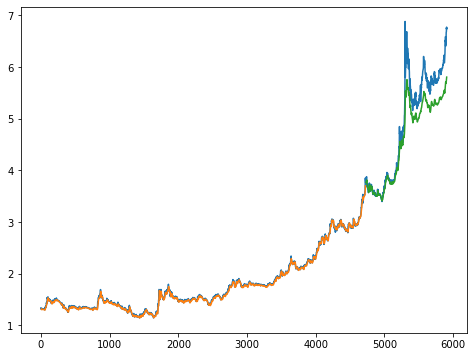

In [84]:
dataset_plot(values, model2_train_predict, model2_test_predict, window_size)

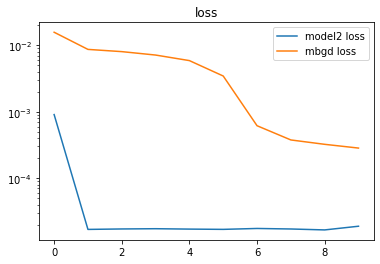

In [85]:
loss(model2, 'model2 loss', 'log')
loss(mbgd_model, 'mbgd loss', 'log')
plt.show()

In [86]:
print('MBGD RMSE EĞİTİM: {0}, TEST: {1}\nMODEL2 RMSE EĞİTİM: {2}, TEST: {3}'.format(
        rmse_mbgd_train, rmse_mbgd_test, rmse_model2_train, rmse_model2_test))

MBGD RMSE EĞİTİM: 0.09262770635563482, TEST: 0.28889920931413215
MODEL2 RMSE EĞİTİM: 0.02418283207455475, TEST: 0.3711410818795095
